# Capstone Project(DA) :- Credit Card Fraud Detection (Banking industry)

## Problem Statement

In recent times, the number of fraud transactions has increased drastically, due to which credit card companies are facing a lot of challenges. For many banks, retaining high profitable customers is the most important business goal. Banking fraud, however, poses a significant threat to this goal. In terms of substantial financial loss, trust and credibility, banking fraud is a concerning issue for both banks and customers alike. With the rise in digital payment channels, the number of fraudulent transactions is also increasing as fraudsters are finding new and different ways to commit such crimes.

Credit card fraud is any dishonest act or behaviour to obtain information without the proper authorisation of the account holder for financial gain. Among the different ways of committing fraud, skimming is the most common one. Skimming is a method used for duplicating information located on the magnetic stripe of the card.

other ways of making fraudulent transactions are as follows:-

    -Manipulation or alteration of genuine cards
    -Creation of counterfeit cards
    -Stolen or lost credit cards
    -Fraudulent telemarketing

## Business Goals and Objectives

As a part of the analytics team working on a fraud detection model and its cost-benefit analysis. You need to develop a machine learning model to detect fraudulent transactions based on the historical transactional data of customers with a pool of merchants.

Identify credit card frauds and be vigilant enough to reduce losses incurred due to such unauthorised transactions by the fraudsters.

After the model has been built and evaluated with the appropriate metrics, you need to demonstrate its potential benefits by performing a cost-benefit analysis.

we need to compare the costs incurred before and after the model is deployed. Earlier, the bank paid the entire transaction amount to the customer for every fraudulent transaction which accounted for a heavy loss to the bank.

## Note :- To run file you need atleast 1 hour and high configuration - Due to machine learning models

# 1. Data understanding

In [1]:
#Importing libraries

# Importing Pandas and NumPy
import pandas as pd
import numpy as np

# Importing matplotlib and seaborn

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import metrics

#All models import 

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier

import statsmodels.api as sm

# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [2]:
# Setting Maximum displaying rows and column can help in better readability of data.
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',600)

## Reading and Understanding the Data

NOTE - Please change the directory path of the dataset in the below query as per your data availability

##### Note:- Since the file is already split between train and test, we will learn from the given train data and validate our learnings from the test data

In [3]:
# loading CSV data into Dataframe using Pandas library (from Local machine)

traindf=pd.read_csv(r"fraudTrain.csv",index_col=0) #reading the train data to build a models and Analysis.
testdf= pd.read_csv(r"fraudTest.csv",index_col=0) # reading the test data on which model need to test to check performance

traindf.head() # checking first five rows 

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,NC,28654,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,WA,99160,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,ID,83252,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,MT,59632,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,VA,24433,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [4]:
testdf.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.86,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.9659,-80.9355,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0
1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.84,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.3207,-110.4360,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0
2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,Ashley,Lopez,F,9333 Valentine Point,Bellmore,NY,11710,40.6729,-73.5365,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0
3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.05,Brian,Williams,M,32941 Krystal Mill Apt. 552,Titusville,FL,32780,28.5697,-80.8191,54767,Set designer,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0
4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.19,Nathan,Massey,M,5783 Evan Roads Apt. 465,Falmouth,MI,49632,44.2529,-85.0170,1126,Furniture designer,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0


In [5]:
#Keeping one copy of original for future use if required
train_orignal=traindf.copy()
test_orignal=testdf.copy()
train_orignal.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,NC,28654,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,WA,99160,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,ID,83252,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,MT,59632,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,VA,24433,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [6]:
test_orignal.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.86,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.9659,-80.9355,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0
1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.84,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.3207,-110.4360,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0
2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,Ashley,Lopez,F,9333 Valentine Point,Bellmore,NY,11710,40.6729,-73.5365,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0
3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.05,Brian,Williams,M,32941 Krystal Mill Apt. 552,Titusville,FL,32780,28.5697,-80.8191,54767,Set designer,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0
4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.19,Nathan,Massey,M,5783 Evan Roads Apt. 465,Falmouth,MI,49632,44.2529,-85.0170,1126,Furniture designer,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0


## Data Inspection

In [7]:
# Checking shape of data (No of rows, no of columns)
Total_rows= traindf.shape[0]+testdf.shape[0]

print("Total data values in Train & Test :-",Total_rows)
print('\nTrain vs Test ratio : ',100 - 100*round(testdf.shape[0]/traindf.shape[0],1),'% : ',100*round(testdf.shape[0]/traindf.shape[0],1),'%')
print("\nTrain data set shape :-",traindf.shape)
print("Test data set shape :-",testdf.shape)

Total data values in Train & Test :- 1852394

Train vs Test ratio :  60.0 % :  40.0 %

Train data set shape :- (1296675, 22)
Test data set shape :- (555719, 22)


#### Concating the Train & Test Datasets ( for Preprocessing )

    -Concatenate the train and test datasets for data cleaning and data preperations
    -The concatenated dataset will have a label indicating a record belong to which data set = train or test
    -Once the dataset is good for modeiling, we will split the dataset back to train and test besed on the above label

In [8]:
# creating the test and train label in the respective datasets

traindf['split_label'] = 'train' 
testdf['split_label'] = 'test'

In [9]:
# concating the train and the test data

concat_df = pd.concat([traindf,testdf], axis = 0)
concat_df.shape # Shape of consolidated data set

(1852394, 23)

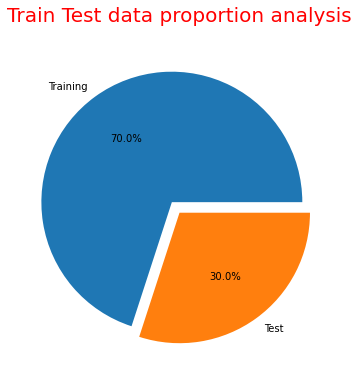

In [10]:
# lets visualise the proportion of the train-test dataset
plt.figure(figsize=[6,6])
#concat_df['split_label'].value_counts(normalize = True).plot(kind = 'pie' );
myexplode=[0.1,0]
plt.pie(concat_df['split_label'].value_counts(normalize = True), labels=["Training","Test"], explode=myexplode, autopct='%1.1f%%')
plt.title("Train Test data proportion analysis\n", fontdict={'fontsize':20,'fontweight':6,'color':'red'})

plt.show()

In [11]:
concat_df.info() #Providing information about dataframe data types.

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1852394 entries, 0 to 555718
Data columns (total 23 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   trans_date_trans_time  object 
 1   cc_num                 int64  
 2   merchant               object 
 3   category               object 
 4   amt                    float64
 5   first                  object 
 6   last                   object 
 7   gender                 object 
 8   street                 object 
 9   city                   object 
 10  state                  object 
 11  zip                    int64  
 12  lat                    float64
 13  long                   float64
 14  city_pop               int64  
 15  job                    object 
 16  dob                    object 
 17  trans_num              object 
 18  unix_time              int64  
 19  merch_lat              float64
 20  merch_long             float64
 21  is_fraud               int64  
 22  split_label        

In [12]:
# Statstical information for all numerical columns which gives idea about data distribution.
concat_df.describe()

,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud
count,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06,1.852394e+06
mean,4.173860e+17,7.006357e+01,4.881326e+04,3.853931e+01,-9.022783e+01,8.864367e+04,1.358674e+09,3.853898e+01,-9.022794e+01,5.210015e-03
std,1.309115e+18,1.592540e+02,2.688185e+04,5.071470e+00,1.374789e+01,3.014876e+05,1.819508e+07,5.105604e+00,1.375969e+01,7.199217e-02
min,6.041621e+10,1.000000e+00,1.257000e+03,2.002710e+01,-1.656723e+02,2.300000e+01,1.325376e+09,1.902742e+01,-1.666716e+02,0.000000e+00
25%,1.800429e+14,9.640000e+00,2.623700e+04,3.466890e+01,-9.679800e+01,7.410000e+02,1.343017e+09,3.474012e+01,-9.689944e+01,0.000000e+00
50%,3.521417e+15,4.745000e+01,4.817400e+04,3.935430e+01,-8.747690e+01,2.443000e+03,1.357089e+09,3.936890e+01,-8.744069e+01,0.000000e+00
75%,4.642255e+15,8.310000e+01,7.204200e+04,4.194040e+01,-8.015800e+01,2.032800e+04,1.374581e+09,4.195626e+01,-8.024511e+01,0.000000e+00
max,4.992346e+18,2.894890e+04,9.992100e+04,6.669330e+01,-6.795030e+01,2.906700e+06,1.388534e+09,6.751027e+01,-6.695090e+01,1.000000e+00


In [13]:
# Checking the missing values
concat_df.isnull().sum()

trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
split_label              0
dtype: int64

In [14]:
# check for the duplicated records.
concat_df.duplicated().sum()

0

In [15]:
concat_df.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,split_label
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,NC,28654,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,train
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,WA,99160,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,train
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,ID,83252,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,train
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,MT,59632,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,train
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,VA,24433,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,train


In [16]:
# Converting "trans_date_trans_time","dob " columns to datetime format

concat_df['trans_date_trans_time'] = pd.to_datetime(concat_df['trans_date_trans_time'])

concat_df['trans_date']=concat_df['trans_date_trans_time'].dt.strftime('%Y-%m-%d') #to seperate transaction date for future analysis

concat_df['dob']=pd.to_datetime(concat_df['dob']) #Converting Date of birth in datetime

concat_df['trans_date'] = pd.to_datetime(concat_df['trans_date'])

In [17]:
# Creating a new column called Transaction Time

concat_df['trans_Time'] = pd.to_datetime(concat_df['trans_date_trans_time'], format='%Y:%M:%D').dt.time

In [18]:
# Creating field for age on transaction date - help for bucketing and analysis

concat_df['age_at_trans'] = round((concat_df['trans_date'] - concat_df['dob'])/np.timedelta64(1, 'Y'))
concat_df['age_at_trans'] = concat_df['age_at_trans'].astype('int')

In [19]:
concat_df.head(3)

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,split_label,trans_date,trans_Time,age_at_trans
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,NC,28654,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,train,2019-01-01,00:00:18,31
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,WA,99160,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,train,2019-01-01,00:00:44,41
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,ID,83252,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,train,2019-01-01,00:00:51,57


In [20]:
concat_df.info()   #Checking datatypes after converting

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1852394 entries, 0 to 555718
Data columns (total 26 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   trans_date_trans_time  datetime64[ns]
 1   cc_num                 int64         
 2   merchant               object        
 3   category               object        
 4   amt                    float64       
 5   first                  object        
 6   last                   object        
 7   gender                 object        
 8   street                 object        
 9   city                   object        
 10  state                  object        
 11  zip                    int64         
 12  lat                    float64       
 13  long                   float64       
 14  city_pop               int64         
 15  job                    object        
 16  dob                    datetime64[ns]
 17  trans_num              object        
 18  unix_time              

In [21]:
#calculate the Day of Week
concat_df["day_of_week"]=concat_df["trans_date"].dt.day_name()

In [22]:
# # Creating a new column Month 

concat_df['month'] = pd.DatetimeIndex(concat_df['trans_date_trans_time']).month

In [23]:
# calculates the distance between the customer's base location and the merchant location using the Haversine formula.
import math
from math import atan2
from math import radians, sin, cos, sqrt

def haversine_distance(lat1, lon1, lat2, lon2):
    earth_radius = 6371  # kilometers
    d_lat = radians(lat2 - lat1)
    d_lon = radians(lon2 - lon1)
    lat1, lat2 = radians(lat1), radians(lat2)

    a = (sin(d_lat/2)**2)+ (sin(d_lon/2)**2) * cos(lat1) * cos(lat2)
    c = 2 * atan2(sqrt(a), sqrt(1-a))

    return earth_radius * c

concat_df['dist_in_km'] = concat_df.apply(lambda x: haversine_distance(x['lat'], x['long'], x['merch_lat'], x['merch_long']), axis=1)


In [24]:
concat_df.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,split_label,trans_date,trans_Time,age_at_trans,day_of_week,month,dist_in_km
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,NC,28654,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,train,2019-01-01,00:00:18,31,Tuesday,1,78.597568
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,WA,99160,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,train,2019-01-01,00:00:44,41,Tuesday,1,30.212176
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,ID,83252,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,train,2019-01-01,00:00:51,57,Tuesday,1,108.206083
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,MT,59632,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,train,2019-01-01,00:01:16,52,Tuesday,1,95.673231
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,VA,24433,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,train,2019-01-01,00:03:06,33,Tuesday,1,77.556744


In [25]:
# Dropping unnecessay columns 

concat_df.drop(['trans_date_trans_time',"first","last",'dob', 'lat','long', 'merch_lat','merch_long'], axis=1, inplace=True)
concat_df.head()

,cc_num,merchant,category,amt,gender,street,city,state,zip,city_pop,job,trans_num,unix_time,is_fraud,split_label,trans_date,trans_Time,age_at_trans,day_of_week,month,dist_in_km
0,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,F,561 Perry Cove,Moravian Falls,NC,28654,3495,"Psychologist, counselling",0b242abb623afc578575680df30655b9,1325376018,0,train,2019-01-01,00:00:18,31,Tuesday,1,78.597568
1,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,F,43039 Riley Greens Suite 393,Orient,WA,99160,149,Special educational needs teacher,1f76529f8574734946361c461b024d99,1325376044,0,train,2019-01-01,00:00:44,41,Tuesday,1,30.212176
2,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,M,594 White Dale Suite 530,Malad City,ID,83252,4154,Nature conservation officer,a1a22d70485983eac12b5b88dad1cf95,1325376051,0,train,2019-01-01,00:00:51,57,Tuesday,1,108.206083
3,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,M,9443 Cynthia Court Apt. 038,Boulder,MT,59632,1939,Patent attorney,6b849c168bdad6f867558c3793159a81,1325376076,0,train,2019-01-01,00:01:16,52,Tuesday,1,95.673231
4,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,M,408 Bradley Rest,Doe Hill,VA,24433,99,Dance movement psychotherapist,a41d7549acf90789359a9aa5346dcb46,1325376186,0,train,2019-01-01,00:03:06,33,Tuesday,1,77.556744


In [26]:
#Checking Unique values for all features
concat_df.nunique().sort_values()

gender                2
split_label           2
is_fraud              2
day_of_week           7
month                12
category             14
state                51
age_at_trans         83
job                 497
merchant            693
trans_date          730
city_pop            891
city                906
zip                 985
cc_num              999
street              999
amt               60616
trans_Time        86400
unix_time       1819583
trans_num       1852394
dist_in_km      1852394
dtype: int64

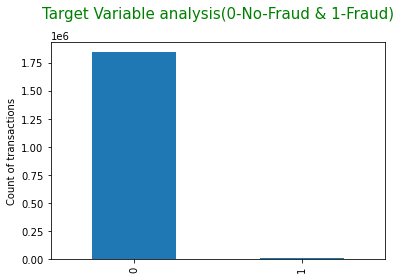

In [27]:
#Inspect the target variable distribution

concat_df["is_fraud"].value_counts().plot(kind="bar")
plt.title("Target Variable analysis(0-No-Fraud & 1-Fraud)\n" , fontdict={'fontsize':15,'fontweight':6,'color':'green'})
plt.ylabel('Count of transactions')
plt.show()

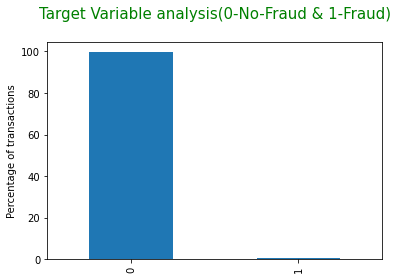

In [28]:
(concat_df["is_fraud"].value_counts(normalize= True)*100).plot(kind="bar")
plt.title("Target Variable analysis(0-No-Fraud & 1-Fraud)\n" , fontdict={'fontsize':15,'fontweight':6,'color':'green'})
plt.ylabel('Percentage of transactions')
plt.show()

#### Checking Data Imbalance on Target Variable - "is_fraud"

In [29]:
# Checking Imbalance of Data Converted_0 == 0(Lead not Converted) test_data1== 1 (Lead Converted)

Nofarud_0=concat_df[concat_df["is_fraud"]==0]
fraud_1=concat_df[concat_df["is_fraud"]==1]
print("shape of All not Fraud Transactions -", Nofarud_0.shape)
print("shape of All Fraud Transactions -", fraud_1.shape)

shape of All not Fraud Transactions - (1842743, 21)
shape of All Fraud Transactions - (9651, 21)


In [30]:
#Calculating Data Imbalance
imbalance= round((Nofarud_0.shape[0])/(fraud_1.shape[0]),3)
print("Imbalance Ratio is =",imbalance)

Imbalance Ratio is = 190.938


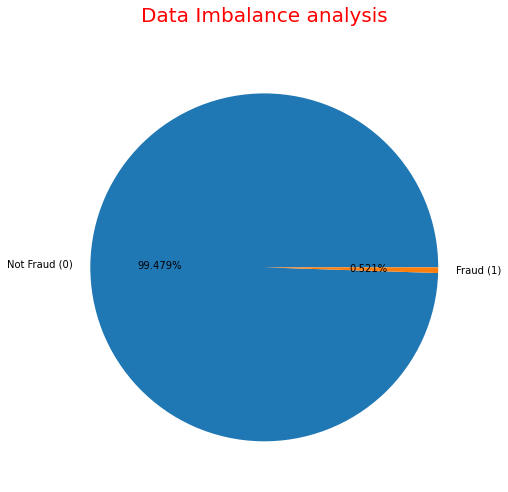

In [31]:
# Checking data distribution using Pie Chart - Consolidated (Train+Test)
plt.figure(figsize=[8,8])
#myexplode=[0.2,0]
plt.pie([Nofarud_0.shape[0],fraud_1.shape[0]], labels=["Not Fraud (0)","Fraud (1)"], autopct='%1.3f%%')
plt.title("Data Imbalance analysis\n", fontdict={'fontsize':20,'fontweight':6,'color':'red'})
plt.show()

### Comments :- 

    - Data set is highly imbalanced, Out of a total of 18,52,394 transactions, 9651 are fraudulent, with the positive class  (frauds) accounting for 0.521% of the total transactions. Class Not fraud accounting for 99.479% of total transactions.

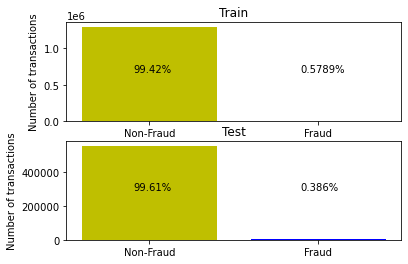

In [32]:
# Checking Class Imbalance (For Seperate Train & Test Dataset)

df_train1=concat_df[concat_df["split_label"]=="train"]
classes_train=df_train1['is_fraud'].value_counts()
normal_share_train=classes_train[0]/df_train1['is_fraud'].count()*100
fraud_share_train=classes_train[1]/df_train1['is_fraud'].count()*100


plt.subplot(2,1,1)
plt.bar(['Non-Fraud','Fraud'], classes_train, color=['y','b'])
plt.title('Train')
plt.ylabel('Number of transactions')
plt.annotate("{0:.4}%".format(normal_share_train),(0.2, 0.5), xycoords='axes fraction')
plt.annotate("{0:.4}%".format(fraud_share_train),(0.7, 0.5), xycoords='axes fraction')

df_test1=concat_df[concat_df["split_label"]=="test"]
classes_test=df_test1['is_fraud'].value_counts()
normal_share_test=classes_test[0]/df_test1['is_fraud'].count()*100
fraud_share_test=classes_test[1]/df_test1['is_fraud'].count()*100

plt.subplot(2,1,2)
plt.bar(['Non-Fraud','Fraud'], classes_test, color=['y','b'])
plt.title('Test')
plt.ylabel('Number of transactions')
plt.annotate("{0:.4}%".format(normal_share_test),(0.2, 0.5), xycoords='axes fraction')
plt.annotate("{0:.4}%".format(fraud_share_test),(0.7, 0.5), xycoords='axes fraction')


plt.show()

# 2.Exploratory data analytics (EDA):

### Performing univariate and bivariate analyses of the data

In [33]:
concat_df.head()

,cc_num,merchant,category,amt,gender,street,city,state,zip,city_pop,job,trans_num,unix_time,is_fraud,split_label,trans_date,trans_Time,age_at_trans,day_of_week,month,dist_in_km
0,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,F,561 Perry Cove,Moravian Falls,NC,28654,3495,"Psychologist, counselling",0b242abb623afc578575680df30655b9,1325376018,0,train,2019-01-01,00:00:18,31,Tuesday,1,78.597568
1,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,F,43039 Riley Greens Suite 393,Orient,WA,99160,149,Special educational needs teacher,1f76529f8574734946361c461b024d99,1325376044,0,train,2019-01-01,00:00:44,41,Tuesday,1,30.212176
2,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,M,594 White Dale Suite 530,Malad City,ID,83252,4154,Nature conservation officer,a1a22d70485983eac12b5b88dad1cf95,1325376051,0,train,2019-01-01,00:00:51,57,Tuesday,1,108.206083
3,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,M,9443 Cynthia Court Apt. 038,Boulder,MT,59632,1939,Patent attorney,6b849c168bdad6f867558c3793159a81,1325376076,0,train,2019-01-01,00:01:16,52,Tuesday,1,95.673231
4,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,M,408 Bradley Rest,Doe Hill,VA,24433,99,Dance movement psychotherapist,a41d7549acf90789359a9aa5346dcb46,1325376186,0,train,2019-01-01,00:03:06,33,Tuesday,1,77.556744


In [34]:
#Performing EDA to analyse FRaud transactions

fraud_eda=concat_df[concat_df["is_fraud"]==1]
fraud_eda

,cc_num,merchant,category,amt,gender,street,city,state,zip,city_pop,job,trans_num,unix_time,is_fraud,split_label,trans_date,trans_Time,age_at_trans,day_of_week,month,dist_in_km
2449,4613314721966,fraud_Rutherford-Mertz,grocery_pos,281.06,M,542 Steve Curve Suite 011,Collettsville,NC,28611,885,Soil scientist,e8a81877ae9a0a7f883e15cb39dc4022,1325466397,1,train,2019-01-02,01:06:37,30,Wednesday,1,68.953442
2472,340187018810220,"fraud_Jenkins, Hauck and Friesen",gas_transport,11.52,F,27954 Hall Mill Suite 575,San Antonio,TX,78208,1595797,Horticultural consultant,bc7d41c41103877b03232f03f1f8d3f5,1325468849,1,train,2019-01-02,01:47:29,58,Wednesday,1,78.406096
2523,340187018810220,fraud_Goodwin-Nitzsche,grocery_pos,276.31,F,27954 Hall Mill Suite 575,San Antonio,TX,78208,1595797,Horticultural consultant,b98f12f4168391b2203238813df5aa8c,1325473523,1,train,2019-01-02,03:05:23,58,Wednesday,1,41.012191
2546,4613314721966,fraud_Erdman-Kertzmann,gas_transport,7.03,M,542 Steve Curve Suite 011,Collettsville,NC,28611,885,Soil scientist,397894a5c4c02e3c61c784001f0f14e4,1325475483,1,train,2019-01-02,03:38:03,30,Wednesday,1,34.145794
2553,340187018810220,fraud_Koepp-Parker,grocery_pos,275.73,F,27954 Hall Mill Suite 575,San Antonio,TX,78208,1595797,Horticultural consultant,7863235a750d73a244c07f1fb7f0185a,1325476547,1,train,2019-01-02,03:55:47,58,Wednesday,1,44.209442
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517197,2242176657877538,"fraud_Willms, Kris and Bergnaum",shopping_pos,1041.51,M,1327 Rose Causeway Apt. 610,Senatobia,MS,38668,14462,Database administrator,35b0297dd026d2e9a75d024a5dec7955,1387749948,1,test,2020-12-22,22:05:48,62,Tuesday,12,6.945705
517274,2242176657877538,fraud_Kuhn LLC,shopping_pos,868.09,M,1327 Rose Causeway Apt. 610,Senatobia,MS,38668,14462,Database administrator,da7f67d7375f10a054a3d919448c45dd,1387750687,1,test,2020-12-22,22:18:07,62,Tuesday,12,75.956505
517341,2242176657877538,"fraud_Mosciski, Ziemann and Farrell",shopping_net,1039.42,M,1327 Rose Causeway Apt. 610,Senatobia,MS,38668,14462,Database administrator,25b076c7bcd70f272c1c5326bb234f4b,1387751508,1,test,2020-12-22,22:31:48,62,Tuesday,12,36.534673
517529,2242176657877538,fraud_Bauch-Raynor,grocery_pos,289.27,M,1327 Rose Causeway Apt. 610,Senatobia,MS,38668,14462,Database administrator,2df7d894868fbc99ec1d8b055585fc9d,1387753563,1,test,2020-12-22,23:06:03,62,Tuesday,12,48.808449


In [35]:
# Functions to plot countplots for categorical variables with target variable

# For single plot
def plot_cat_var(var):
    plt.figure(figsize=(20, 7))
    ax=sns.countplot(x = var, hue = "is_fraud", data = concat_df)
    plt.xticks(fontsize=15,rotation = 90)
    plt.xlabel(var,fontsize=20)
    for p in ax.patches:
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()),rotation=45)
    plt.show()

# For multiple plots    
def plot_cat_multivar(lst):
    l = int(len(lst)/2)
    plt.figure(figsize=(20, l*7))
    for var in lst:
        plt.subplot(l,2,lst.index(var)+1)
        sns.countplot(x = var, hue = "is_fraud", data = concat_df)
        plt.xticks(fontsize=15,rotation = 90)
        plt.tight_layout
    
    plt.show()

In [36]:
# Categorical variables
category_var = list(concat_df.columns[concat_df.dtypes == 'object'])
category_var

['merchant',
 'category',
 'gender',
 'street',
 'city',
 'state',
 'job',
 'trans_num',
 'split_label',
 'trans_Time',
 'day_of_week']

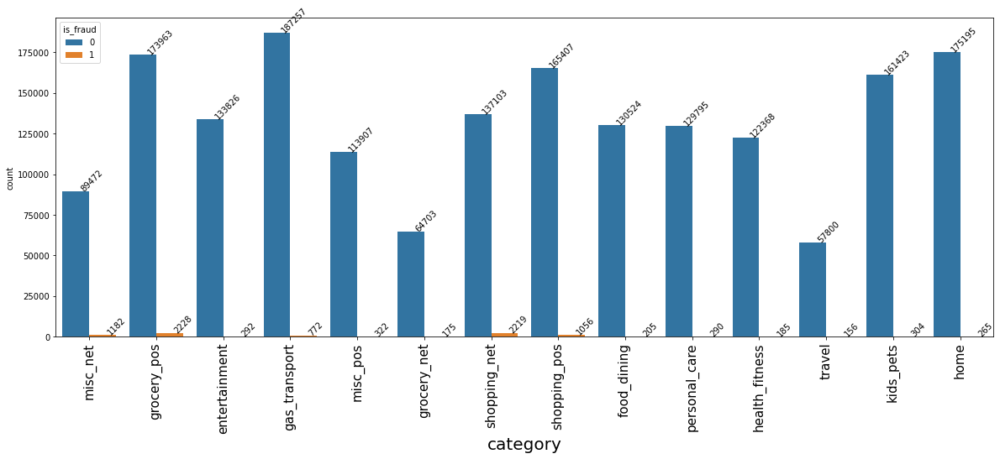

In [37]:
#Plotting gragh - column "category"
plot_cat_var(category_var[1])

### Observation:-

In column "category" (Is_fraud =1)

    - grocery_pos, shopping_net, misc_net, shopping_pos, gas_transport these are top 5 category which are having more 
       chances of having fraudulent transaction.
    
    - food_dining, health_fitness, grocery_net, travel having least fraud transaction.

Text(0.5, 1.0, 'Gender Distribution (Fraud=1)')

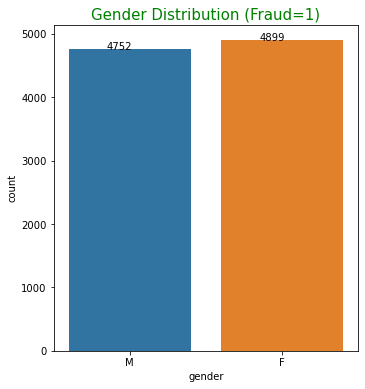

In [38]:
# 1. On the basis of gender - (Is_fraud =1)
plt.figure(figsize=[12,6])
plt.subplot(1,2,1)
ax=sns.countplot(data=fraud_eda, x="gender")

for p in ax.patches:
        ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()))
        
plt.title("Gender Distribution (Fraud=1)", fontdict={'fontsize':15,'fontweight':6,'color':'green'})

### Comments:-

    -Female having more fradulent transaction count over man the difference is not huge
    - Need to focus on both gender equally to check fraudulent

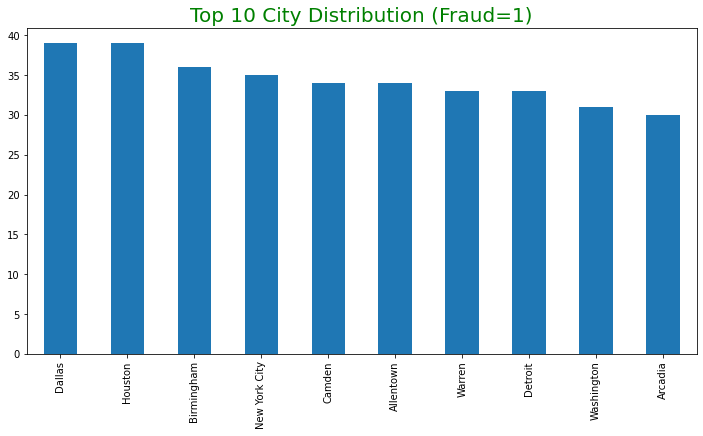

In [39]:
#TOp 10 city having highest Fraud
plt.figure(figsize=[12,6])
fraud_eda["city"].value_counts().head(10).plot(kind='bar')
plt.title("Top 10 City Distribution (Fraud=1)", fontdict={'fontsize':20,'fontweight':8,'color':'green'})
plt.show()

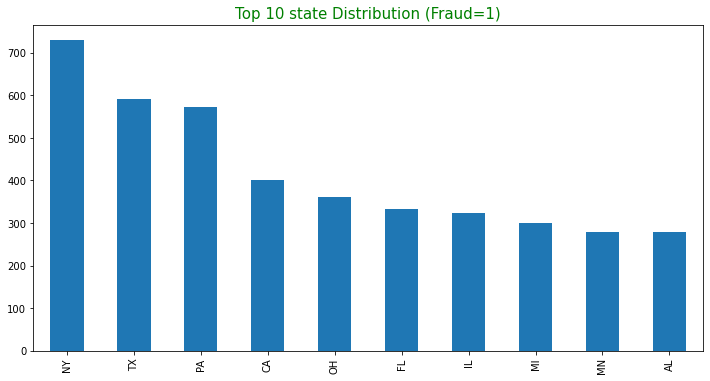

In [40]:
#Top 10 state having highest fraud count
plt.figure(figsize=[12,6])
fraud_eda["state"].value_counts().head(10).plot(kind='bar')
plt.title("Top 10 state Distribution (Fraud=1)", fontdict={'fontsize':15,'fontweight':6,'color':'green'})
plt.show()

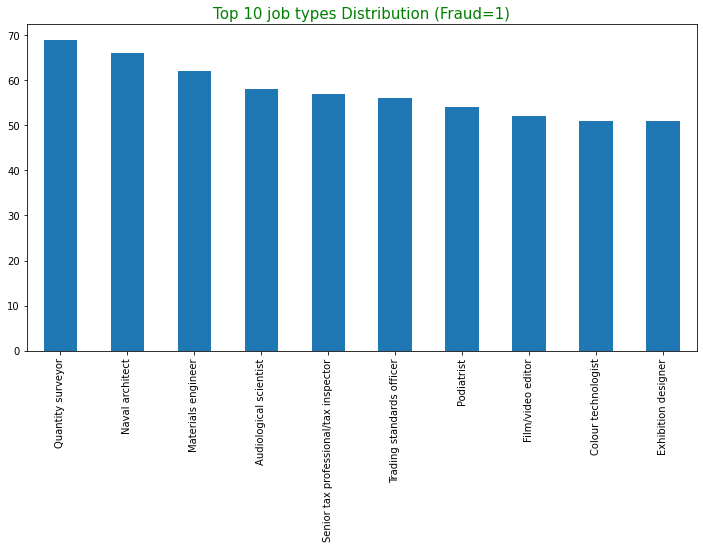

In [41]:
#Top 10 job having highest fraud count
plt.figure(figsize=[12,6])
fraud_eda["job"].value_counts().head(10).plot(kind='bar')
plt.title("Top 10 job types Distribution (Fraud=1)", fontdict={'fontsize':15,'fontweight':6,'color':'green'})
plt.show()

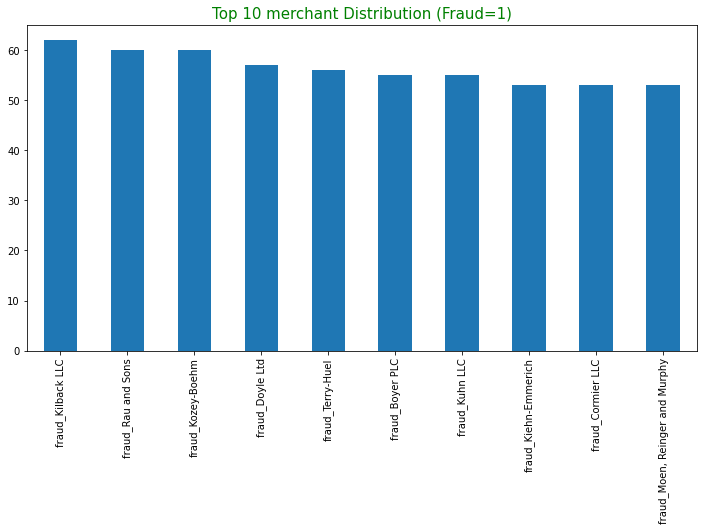

In [42]:
#Top 10 merchant having highest fraud count
plt.figure(figsize=[12,6])
fraud_eda["merchant"].value_counts().head(10).plot(kind='bar')
plt.title("Top 10 merchant Distribution (Fraud=1)", fontdict={'fontsize':15,'fontweight':6,'color':'green'})
plt.show()

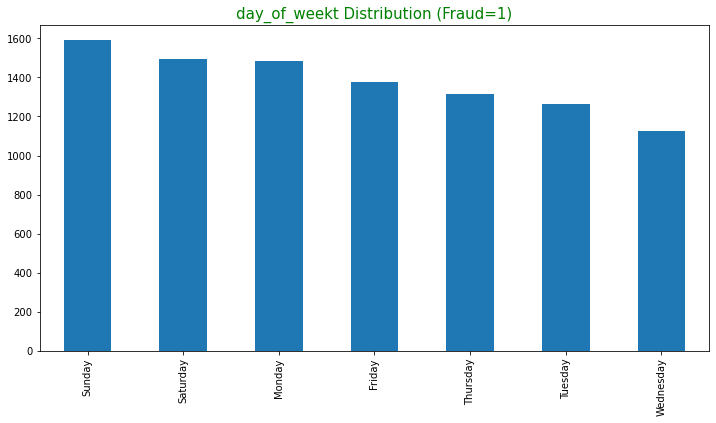

In [43]:
#day_of_week having highest fraud count
plt.figure(figsize=[12,6])
fraud_eda["day_of_week"].value_counts().plot(kind='bar')
plt.title("day_of_weekt Distribution (Fraud=1)", fontdict={'fontsize':15,'fontweight':6,'color':'green'})
plt.show()

### Comments:- 

    -Saturday, sunday having highest fraud transactions 

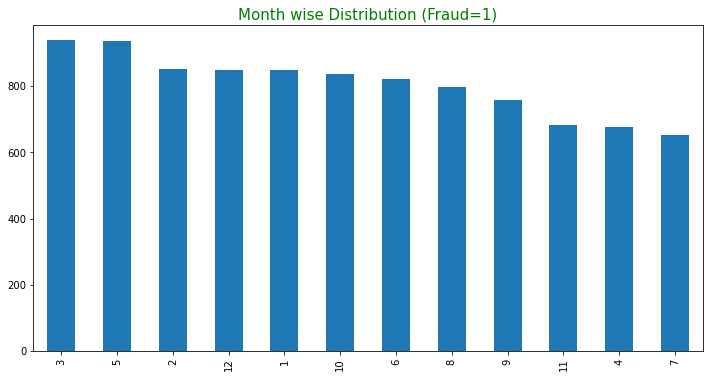

In [44]:
#day_of_week having highest fraud count
plt.figure(figsize=[12,6])
fraud_eda["month"].value_counts().plot(kind='bar')
plt.title("Month wise Distribution (Fraud=1)", fontdict={'fontsize':15,'fontweight':6,'color':'green'})
plt.show()

### Comments

    -March & May showing highest no of fradulent transaction.
    - April & July having least fraud transactions

In [45]:
#Grouping customesrs on the basis of Age

fraud_eda["Age_Group"] = pd.cut(fraud_eda["age_at_trans"],[0,20, 30, 50, 60], precision=0, labels=["very_Young","Young","Mid-Aged","Old"])

In [46]:
fraud_eda.head(2)

,cc_num,merchant,category,amt,gender,street,city,state,zip,city_pop,job,trans_num,unix_time,is_fraud,split_label,trans_date,trans_Time,age_at_trans,day_of_week,month,dist_in_km,Age_Group
2449,4613314721966,fraud_Rutherford-Mertz,grocery_pos,281.06,M,542 Steve Curve Suite 011,Collettsville,NC,28611,885,Soil scientist,e8a81877ae9a0a7f883e15cb39dc4022,1325466397,1,train,2019-01-02,01:06:37,30,Wednesday,1,68.953442,Young
2472,340187018810220,"fraud_Jenkins, Hauck and Friesen",gas_transport,11.52,F,27954 Hall Mill Suite 575,San Antonio,TX,78208,1595797,Horticultural consultant,bc7d41c41103877b03232f03f1f8d3f5,1325468849,1,train,2019-01-02,01:47:29,58,Wednesday,1,78.406096,Old


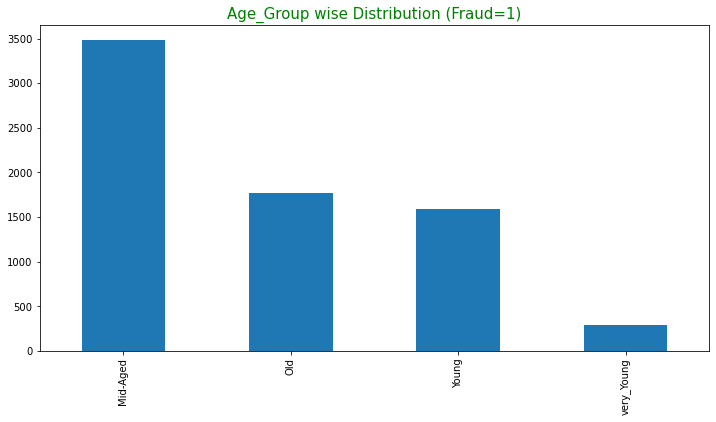

In [47]:
#day_of_week having highest fraud count
plt.figure(figsize=[12,6])
fraud_eda["Age_Group"].value_counts().plot(kind='bar')
plt.title("Age_Group wise Distribution (Fraud=1)", fontdict={'fontsize':15,'fontweight':6,'color':'green'})
plt.show()

# Comment:-

    - Mid Aged people between 30 to 50 are most no of fraudulent activity

In [48]:
#Describing summary for Numerical variables

round(concat_df.describe(),2)

,cc_num,amt,zip,city_pop,unix_time,is_fraud,age_at_trans,month,dist_in_km
count,1.852394e+06,1852394.00,1852394.00,1852394.00,1.852394e+06,1852394.00,1852394.00,1852394.00,1852394.00
mean,4.173860e+17,70.06,48813.26,88643.67,1.358674e+09,0.01,46.26,7.15,76.11
std,1.309115e+18,159.25,26881.85,301487.62,1.819508e+07,0.07,17.41,3.42,29.12
min,6.041621e+10,1.00,1257.00,23.00,1.325376e+09,0.00,14.00,1.00,0.02
25%,1.800429e+14,9.64,26237.00,741.00,1.343017e+09,0.00,33.00,4.00,55.32
50%,3.521417e+15,47.45,48174.00,2443.00,1.357089e+09,0.00,44.00,7.00,78.22
75%,4.642255e+15,83.10,72042.00,20328.00,1.374581e+09,0.00,57.00,10.00,98.51
max,4.992346e+18,28948.90,99921.00,2906700.00,1.388534e+09,1.00,96.00,12.00,152.12


##### Checking if there are any highly skewed variables

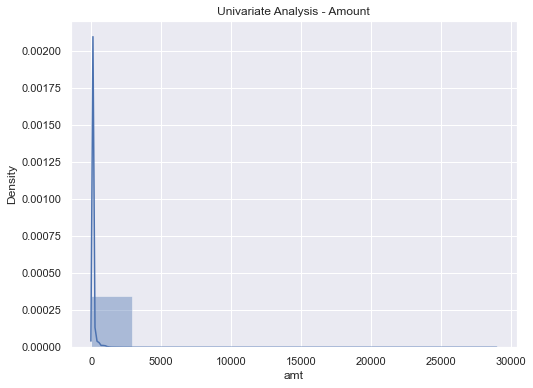

In [49]:
#Plotting distribution plot for feature "amt"
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(concat_df['amt'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

##### Comments:-

    - As the kernel density function clearly shows major skewness, treating the variable amt with log transformations

In [50]:
#Treating skewness in "amt" feature
concat_df['amt'] = np.log(concat_df['amt'])

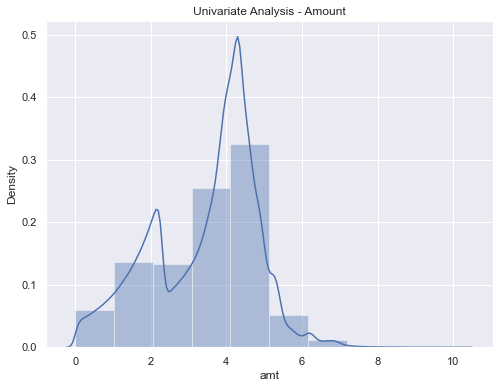

In [51]:
#Checking skewness after transformation
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(concat_df['amt'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

##### Comment:-

    - In Feature "amt" after tranformation data skewness resolved

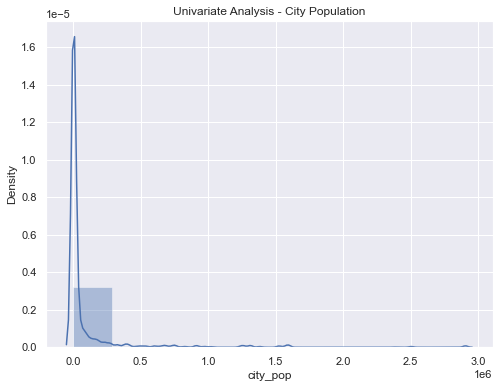

In [52]:
#Plotting distribution plot for feature "city_pop"
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(concat_df['city_pop'], bins = 10, kde = True)
plt.title('Univariate Analysis - City Population')
plt.show()

- As the kernel density function clearly shows major skewness, treating the variable city_pop with log transformations

In [53]:
#Applying Log Transformation to resolve Skewness
concat_df['city_pop'] = np.log(concat_df['city_pop'])

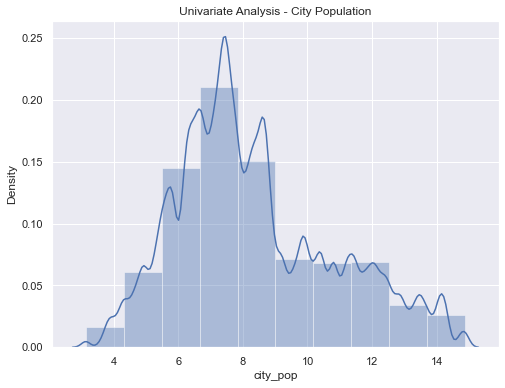

In [54]:
#Plotting distribution plot for feature "city_pop" after resolving Skewness
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(concat_df['city_pop'], bins = 10, kde = True)
plt.title('Univariate Analysis - City Population')
plt.show()

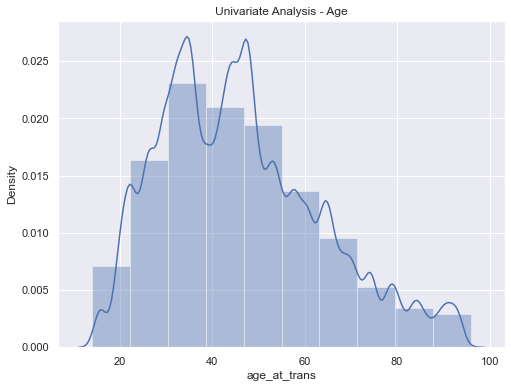

In [55]:
#Plotting distribution plot for feature "age_at_trans"
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(concat_df['age_at_trans'], bins = 10, kde = True)
plt.title('Univariate Analysis - Age')
plt.show()

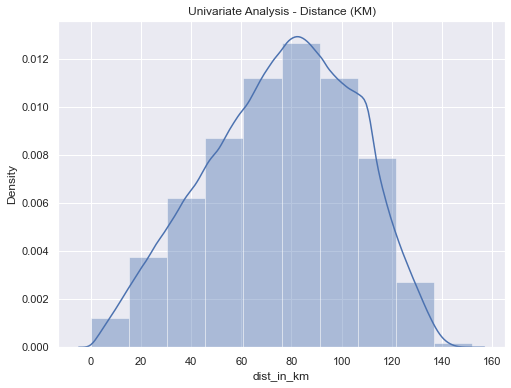

In [56]:
#Plotting distribution plot for feature "dist_in_km"
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(concat_df['dist_in_km'], bins = 10, kde = True)
plt.title('Univariate Analysis - Distance (KM)')
plt.show()

###### Comments:- 

    -No major skewness found in Distance and Age variables

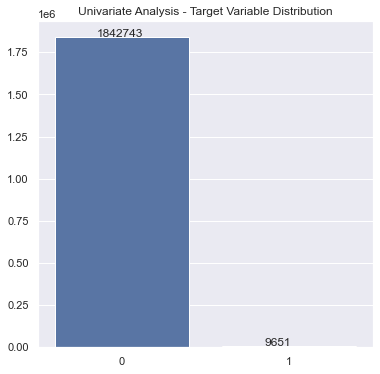

In [57]:
# Let us see the Target Variable distribution across the dataset

x = [0, 1]
y = [concat_df.is_fraud.value_counts()[0],concat_df.is_fraud.value_counts()[1]]

plt.figure(figsize = [6,6])
ax = sns.barplot(x = x, y = y)
plt.title('Univariate Analysis - Target Variable Distribution')

for p in ax.patches:
    ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()))
plt.show()

    -The data shows clear imbalance in the target variable which needs to be handled by sampling methods

Text(0.5, 1.0, 'Univariate Analysis - Gender Distribution')

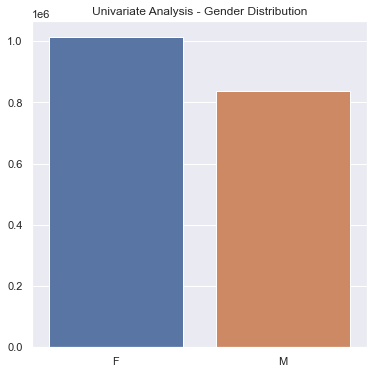

In [58]:
# Let us see the Gender distribution across the dataset

x = ['F', 'M']
y = [concat_df.gender.value_counts()[0], concat_df.gender.value_counts()[1]]

plt.figure(figsize = [6,6])
ax = sns.barplot(x = x, y = y)
plt.title('Univariate Analysis - Gender Distribution')

In [59]:
#Making Gender column binary

concat_df['gender'] = concat_df['gender'].map({'F':1, 'M':0})
concat_df['day_of_week'] = concat_df['day_of_week'].map({'Monday':1, 'Tuesday':2, 'Wednesday': 3, 'Thursday': 4,'Friday':5, 'Saturday':6, 'Sunday': 7})

In [60]:
concat_df.head()

,cc_num,merchant,category,amt,gender,street,city,state,zip,city_pop,job,trans_num,unix_time,is_fraud,split_label,trans_date,trans_Time,age_at_trans,day_of_week,month,dist_in_km
0,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,1.603420,1,561 Perry Cove,Moravian Falls,NC,28654,8.159089,"Psychologist, counselling",0b242abb623afc578575680df30655b9,1325376018,0,train,2019-01-01,00:00:18,31,2,1,78.597568
1,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,4.674976,1,43039 Riley Greens Suite 393,Orient,WA,99160,5.003946,Special educational needs teacher,1f76529f8574734946361c461b024d99,1325376044,0,train,2019-01-01,00:00:44,41,2,1,30.212176
2,38859492057661,fraud_Lind-Buckridge,entertainment,5.394127,0,594 White Dale Suite 530,Malad City,ID,83252,8.331827,Nature conservation officer,a1a22d70485983eac12b5b88dad1cf95,1325376051,0,train,2019-01-01,00:00:51,57,2,1,108.206083
3,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,3.806662,0,9443 Cynthia Court Apt. 038,Boulder,MT,59632,7.569928,Patent attorney,6b849c168bdad6f867558c3793159a81,1325376076,0,train,2019-01-01,00:01:16,52,2,1,95.673231
4,375534208663984,fraud_Keeling-Crist,misc_pos,3.736717,0,408 Bradley Rest,Doe Hill,VA,24433,4.595120,Dance movement psychotherapist,a41d7549acf90789359a9aa5346dcb46,1325376186,0,train,2019-01-01,00:03:06,33,2,1,77.556744


### Splitting consolidated data as its Original dataset Train & Test samples (Using feature "Split_labels")

In [61]:
train_org=concat_df[concat_df["split_label"]=="train"]
train_org.head()

,cc_num,merchant,category,amt,gender,street,city,state,zip,city_pop,job,trans_num,unix_time,is_fraud,split_label,trans_date,trans_Time,age_at_trans,day_of_week,month,dist_in_km
0,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,1.603420,1,561 Perry Cove,Moravian Falls,NC,28654,8.159089,"Psychologist, counselling",0b242abb623afc578575680df30655b9,1325376018,0,train,2019-01-01,00:00:18,31,2,1,78.597568
1,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,4.674976,1,43039 Riley Greens Suite 393,Orient,WA,99160,5.003946,Special educational needs teacher,1f76529f8574734946361c461b024d99,1325376044,0,train,2019-01-01,00:00:44,41,2,1,30.212176
2,38859492057661,fraud_Lind-Buckridge,entertainment,5.394127,0,594 White Dale Suite 530,Malad City,ID,83252,8.331827,Nature conservation officer,a1a22d70485983eac12b5b88dad1cf95,1325376051,0,train,2019-01-01,00:00:51,57,2,1,108.206083
3,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,3.806662,0,9443 Cynthia Court Apt. 038,Boulder,MT,59632,7.569928,Patent attorney,6b849c168bdad6f867558c3793159a81,1325376076,0,train,2019-01-01,00:01:16,52,2,1,95.673231
4,375534208663984,fraud_Keeling-Crist,misc_pos,3.736717,0,408 Bradley Rest,Doe Hill,VA,24433,4.595120,Dance movement psychotherapist,a41d7549acf90789359a9aa5346dcb46,1325376186,0,train,2019-01-01,00:03:06,33,2,1,77.556744


In [62]:
train_org.shape #Checkin and canfirming shape is matching as original data set

(1296675, 21)

####  Features selection required for Model building 

In [63]:
# Selecting usefull features for model building['amt', 'gender', 'city_pop', 'age_at_trans', 'day_of_week', 'month', 'dist_in_km']

train_org=train_org[['amt', 'gender', 'city_pop', 'age_at_trans', 'day_of_week', 'month', 'dist_in_km',"is_fraud"]]
train_org.head()

,amt,gender,city_pop,age_at_trans,day_of_week,month,dist_in_km,is_fraud
0,1.603420,1,8.159089,31,2,1,78.597568,0
1,4.674976,1,5.003946,41,2,1,30.212176,0
2,5.394127,0,8.331827,57,2,1,108.206083,0
3,3.806662,0,7.569928,52,2,1,95.673231,0
4,3.736717,0,4.595120,33,2,1,77.556744,0


In [64]:
train_org.shape

(1296675, 8)

# Train/Test Data Splitting 

    - To handle data imbalance while splitting, using the stratify method

In [65]:
y = train_org.pop('is_fraud')
X = train_org

In [66]:
#Split using Startify samplimg Y due to class imbalance

from sklearn import model_selection
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, stratify = y, random_state=42)

In [67]:
#Checking shapes of the test and train datasets

X_train.shape, X_test.shape

((972506, 7), (324169, 7))

### Scaling Variables For Logistic Regression

In [68]:
train_org.columns

Index(['amt', 'gender', 'city_pop', 'age_at_trans', 'day_of_week', 'month',
       'dist_in_km'],
      dtype='object')

In [69]:
# Making a copy of the X_train and scaling it as that is specific only to Logistic Regression
from sklearn.preprocessing import MinMaxScaler
X_train_lr = X_train.copy()

scaler = MinMaxScaler() #Using MinMaxScalar()

X_train_lr[['amt', 'gender', 'city_pop', 'age_at_trans', 'day_of_week', 'month', 'dist_in_km']] = scaler.fit_transform(X_train[['amt', 'gender', 'city_pop', 'age_at_trans', 'day_of_week', 'month', 'dist_in_km']])
X_train_lr.head()

,amt,gender,city_pop,age_at_trans,day_of_week,month,dist_in_km
267436,0.482372,0.0,0.448670,0.353659,1.000000,0.363636,0.368918
233159,0.251400,1.0,0.230283,0.463415,0.833333,0.272727,0.627032
430072,0.441626,0.0,0.470635,0.560976,0.666667,0.545455,0.709002
236662,0.474693,1.0,0.698418,0.414634,1.000000,0.272727,0.475991
450357,0.462170,0.0,0.477590,0.841463,0.666667,0.545455,0.509887


In [70]:
# Checking Scaling data

X_train_lr.describe()

,amt,gender,city_pop,age_at_trans,day_of_week,month,dist_in_km
count,972506.000000,972506.000000,972506.000000,972506.000000,972506.000000,972506.000000,972506.000000
mean,0.338391,0.546699,0.444523,0.390205,0.511807,0.467545,0.500158
std,0.135778,0.497815,0.208761,0.212136,0.366377,0.310577,0.191454
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.221962,0.000000,0.295607,0.231707,0.166667,0.181818,0.363501
50%,0.377921,1.000000,0.397163,0.365854,0.500000,0.454545,0.513986
75%,0.432530,1.000000,0.577530,0.524390,0.833333,0.727273,0.647446
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Model Building and Hyperparameter Tuning

The algorithms we will be used in order to create classification models that would be sensitive to detecting fraudulent transactions are:

    1.Logistic Regression
    2.Decision Trees
    3.Random Forest
    4.XGBoost
    
Each algorithm will have an unsampled model and will then be compared by using sampling methods - SMOTE and ADASYN Let us proceed with the model building part in the order mentioned above:

## 1.a Logistic Regression - Unsampled

In [71]:
#Applying logistic regression model

logreg_unsampled = LogisticRegression().fit(X_train_lr,y_train)

#### Hyperparameter tuning using Grid Search CV

In [72]:
from sklearn.model_selection import GridSearchCV

#"C" is a hyperparameter that controls the regularization strength
#"penalty" is a hyperparameter that specifies the type of regularization to be applied

params_lr = {
    'C': np.logspace(-3,3,7),
    'penalty': ['l2']
}

# Instantiate the grid search model
grid_search_1 = GridSearchCV(estimator=logreg_unsampled,param_grid=params_lr,cv=5,n_jobs=-1, verbose=1,scoring='recall')

In [73]:
%%time
grid_search_1.fit(X_train_lr, y_train)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
Wall time: 30.2 s


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             scoring='recall', verbose=1)

In [74]:
grid_search_1.best_score_

0.0

## Model Evaluation

The metric used to evaluate the models is - Recall

    -Recall attempts to answer the following question: What proportion of actual positives was identified correctly?
    -Mathematically, recall is defined as:

In [75]:
#Creating function to evaluate model

def model_evalute_lr_unsampled(classifier):
    y_train_pred = classifier.predict(X_train_lr)
    y_test_pred = classifier.predict(X_test)
    
    print('Train set performance:')
    print(metrics.recall_score(y_train, y_train_pred))
    print(metrics.confusion_matrix(y_train, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print("\n",metrics.recall_score(y_test, y_test_pred))
    print("\n",metrics.confusion_matrix(y_test, y_test_pred))

In [76]:
lr_unsampled = grid_search_1.best_estimator_
model_evalute_lr_unsampled(lr_unsampled)

Train set performance:
0.0
[[966877      0]
 [  5629      0]]
-------------------------
Test set performance:

 0.9888119339371337

 [[ 16481 305811]
 [    21   1856]]


## Optimise Cut off - ROC Curve

An ROC curve demonstrate that:-

    -It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by decrease        in specificity).
    -The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
    -The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

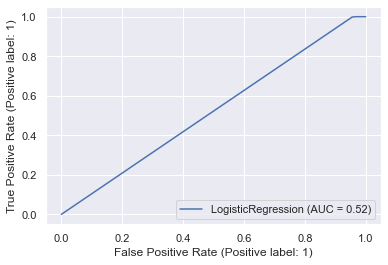

In [77]:
metrics.plot_roc_curve(logreg_unsampled, X_test, y_test)
plt.show()

### Metrics for Logistic Regression - Unsampled:

    -Recall on Train: 0.0
    -Recall on Test: 0.988
    -Area Under the Curve: 0.52

## Now we will try out two sampling methods - SMOTE and ADASYN

In [78]:
from imblearn.over_sampling import SMOTE, ADASYN #importing librarry

X_train_smote_lr, y_train_smote_lr = SMOTE().fit_resample(X_train_lr, y_train)
X_train_adasyn_lr, y_train_adasyn_lr = ADASYN().fit_resample(X_train_lr, y_train)

## 1.b Logistic Regression with SMOTE

In [79]:
#Fitting logistic regression model
logreg_smote = LogisticRegression().fit(X_train_smote_lr,y_train_smote_lr)

In [80]:
#Defining parameter for gridserch CV
params_lr = {
    'C': np.logspace(-3,3,7),
    'penalty': ['l2']
}

grid_search_2 = GridSearchCV(estimator=logreg_smote,
                    param_grid=params_lr,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [81]:
%%time
grid_search_2.fit(X_train_smote_lr, y_train_smote_lr)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
Wall time: 43.4 s


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             scoring='recall', verbose=1)

In [82]:
grid_search_2.best_score_

0.7794373034194393

In [83]:
def model_evalute_lr_smote(classifier):
    y_train_pred = classifier.predict(X_train_smote_lr)
    y_test_pred = classifier.predict(X_test)
    
    print('Train set performance:')
    print(metrics.recall_score(y_train_smote_lr, y_train_pred))
    print(metrics.confusion_matrix(y_train_smote_lr, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print("\n",metrics.recall_score(y_test, y_test_pred))
    print("\n",metrics.confusion_matrix(y_test, y_test_pred))

In [84]:
lr_smote = grid_search_2.best_estimator_
model_evalute_lr_smote(lr_smote)

Train set performance:
0.7794414387765972
[[777656 189221]
 [213253 753624]]
-------------------------
Test set performance:

 1.0

 [[     0 322292]
 [     0   1877]]


## ROC Curve

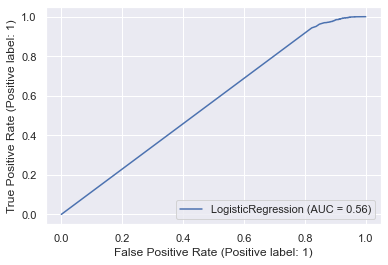

In [85]:
metrics.plot_roc_curve(logreg_smote, X_test, y_test)
plt.show()

### Metrics for Logistic Regression - SMOTE:

    -Recall on Train: 0.78
    -Recall on Test: 1.0
    -Area Under the Curve: 0.56

## 1.c Logistic Regression with ADASYN

In [86]:
##Fitting logistic regression model
logreg_adasyn = LogisticRegression().fit(X_train_adasyn_lr,y_train_adasyn_lr)

In [87]:
params_lr = {
    'C': np.logspace(-3,3,7),
    'penalty': ['l2']
}

grid_search_3 = GridSearchCV(estimator=logreg_adasyn,
                    param_grid=params_lr,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [88]:
%%time
grid_search_3.fit(X_train_adasyn_lr, y_train_adasyn_lr)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
Wall time: 47.3 s


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             scoring='recall', verbose=1)

In [89]:
grid_search_3.best_score_

0.730035871262918

In [90]:
def model_evalute_lr_adasyn(classifier):
    y_train_pred = classifier.predict(X_train_adasyn_lr)
    y_test_pred = classifier.predict(X_test)
    
    print('Train set performance:')
    print(metrics.recall_score(y_train_adasyn_lr, y_train_pred))
    print(metrics.confusion_matrix(y_train_adasyn_lr, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print("/n",metrics.recall_score(y_test, y_test_pred))
    print("/n",metrics.confusion_matrix(y_test, y_test_pred))

In [91]:
lr_adasyn = grid_search_3.best_estimator_
model_evalute_lr_adasyn(lr_adasyn)

Train set performance:
0.7300400089368463
[[723548 243329]
 [260993 705791]]
-------------------------
Test set performance:
/n 1.0
/n [[    19 322273]
 [     0   1877]]


### ROC Curve

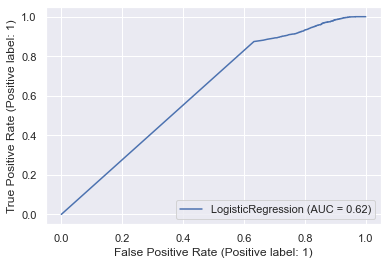

In [92]:
metrics.plot_roc_curve(logreg_adasyn, X_test, y_test)
plt.show()

### Metrics for Logistic Regression - ADASYN:

    -Recall on Train: 0.73
    -Recall on Test: 1.0
    -Area Under the Curve: 0.63

# 2.a Decision Tree Classifier - Unsampled

In [93]:
from sklearn.tree import DecisionTreeClassifier
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score

### Creating  Functions to perform analysis

In [94]:
def show_graph(classifier):
    dot_data = StringIO()
    
    export_graphviz(classifier, out_file = dot_data, filled = True, rounded = True,
               feature_names=X.columns,
               class_names=['No Fraud', 'Fraud'])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [95]:
def model_evaluate_unsampled(classifier):
    y_train_pred = classifier.predict(X_train)
    y_test_pred = classifier.predict(X_test)
    
    print('Train set performance:')
    print(recall_score(y_train, y_train_pred))
    print(confusion_matrix(y_train, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print("\n",recall_score(y_test, y_test_pred))
    print("\n",confusion_matrix(y_test, y_test_pred))

### Hyper-parameter tuning using Grid Search CV

In [96]:
dt_unsampled = DecisionTreeClassifier(random_state=42).fit(X_train,y_train)

##### After various trial and error methods, fixing hyper-parameters to:

In [97]:
params = {
    'max_depth': [3,5,7,9,10],
    'min_samples_leaf': [50,60,70,80,110],
    'criterion': ['gini']
}

grid_search_4 = GridSearchCV(estimator=dt_unsampled,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [98]:
%%time
grid_search_4.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
Wall time: 2min


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [50, 60, 70, 80, 110]},
             scoring='recall', verbose=1)

In [99]:
grid_search_4.best_score_

0.3259879218472469

In [100]:
#Evaluating model 
dt_best = grid_search_4.best_estimator_
model_evaluate_unsampled(dt_best)

Train set performance:
0.3364718422455143
[[966111    766]
 [  3735   1894]]
-------------------------
Test set performance:

 0.3058071390516782

 [[322013    279]
 [  1303    574]]


In [101]:
grid_search_4.best_params_

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 80}

In [102]:
gph = show_graph(dt_best)
Image(gph.create_png())

### ROC Curve

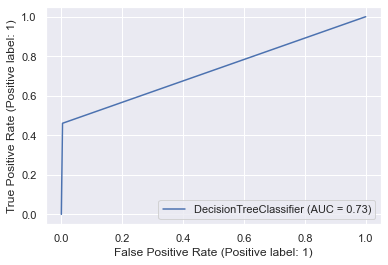

In [103]:
metrics.plot_roc_curve(dt_unsampled, X_test, y_test)
plt.show()

## Metrics for Decision Trees - Unsampled:

    - Recall on Train: 0.33
    - Recall on Test: 0.30
    - Area Under the Curve: 0.73

# 2.b Decision Tree with SMOTE

In [104]:
X_train_smote, y_train_smote = SMOTE().fit_resample(X_train, y_train)

In [105]:
dt_smote = DecisionTreeClassifier(random_state=42).fit(X_train_smote,y_train_smote)


### Creating Functions to perform analysis

In [106]:
def model_evaluate_smote(classifier):
    y_train_pred = classifier.predict(X_train_smote)
    y_test_pred = classifier.predict(X_test)
    
    print('Train set performance:')
    print(recall_score(y_train_smote, y_train_pred))
    print(confusion_matrix(y_train_smote, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print("\n",recall_score(y_test, y_test_pred))
    print("\n",confusion_matrix(y_test, y_test_pred))

In [107]:
params = {
    'max_depth': [3,5,7,9,10],
    'min_samples_leaf': [50,60,70,80,110],
    'criterion': ['gini']
}

grid_search_5 = GridSearchCV(estimator=dt_smote,param_grid=params,cv=5,n_jobs=-1, verbose=1,scoring='recall')

In [108]:
%%time
grid_search_5.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
Wall time: 4min 7s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [50, 60, 70, 80, 110]},
             scoring='recall', verbose=1)

In [109]:
grid_search_5.best_score_

0.8545233789120225

In [110]:
dt_smote = grid_search_5.best_estimator_
model_evaluate_smote(dt_smote)

Train set performance:
0.8548481347679178
[[897657  69220]
 [140344 826533]]
-------------------------
Test set performance:

 0.8220564730953649

 [[299010  23282]
 [   334   1543]]


In [111]:
grid_search_5.best_params_

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 50}

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.363452 to fit



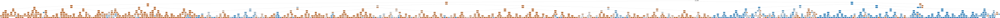

In [112]:
gph = show_graph(dt_smote)
Image(gph.create_png())

### ROC Curve

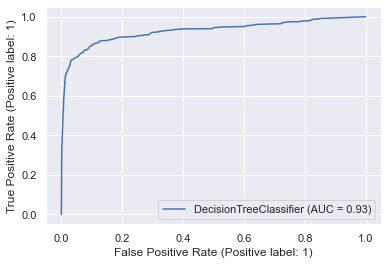

In [113]:
metrics.plot_roc_curve(dt_smote, X_test, y_test)
plt.show()

### Metrics for Decision Trees - SMOTE:

    -Recall on Train: 0.86
    -Recall on Test: 0.83
    -Area Under the Curve: 0.93

# 2.c Decision Tree with ADASYN

In [114]:
X_train_adasyn, y_train_adasyn = ADASYN().fit_resample(X_train, y_train)

In [115]:
#Function to evaluate metrics
def model_evaluate_adasyn(classifier):
    y_train_pred = classifier.predict(X_train_adasyn)
    y_test_pred = classifier.predict(X_test)
    
    print('Train set performance:')
    print("\n",recall_score(y_train_adasyn, y_train_pred))
    print("\n",confusion_matrix(y_train_adasyn, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print("\n",recall_score(y_test, y_test_pred))

In [116]:
dt_adasyn = DecisionTreeClassifier(random_state=42).fit(X_train_adasyn,y_train_adasyn)

In [117]:
params = {
    'max_depth': [3,5,7,9,10],
    'min_samples_leaf': [50,60,70,80,110],
    'criterion': ['gini']
}

grid_search_6 = GridSearchCV(estimator=dt_adasyn,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [118]:
%%time
grid_search_6.fit(X_train_adasyn, y_train_adasyn)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
Wall time: 3min 31s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [50, 60, 70, 80, 110]},
             scoring='recall', verbose=1)

In [119]:
grid_search_6.best_score_

0.8465194331648297

In [120]:
dt_adasyn = grid_search_6.best_estimator_
model_evaluate_adasyn(dt_adasyn)

Train set performance:

 0.8489920858539819

 [[872414  94463]
 [145777 819583]]
-------------------------
Test set performance:

 0.8545551411827385


In [121]:
grid_search_6.best_params_

{'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 50}

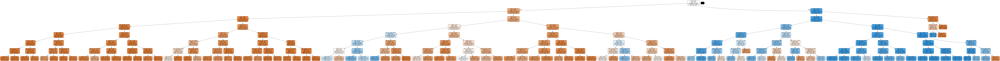

In [122]:
gph = show_graph(dt_adasyn)
Image(gph.create_png())

### ROC Curve

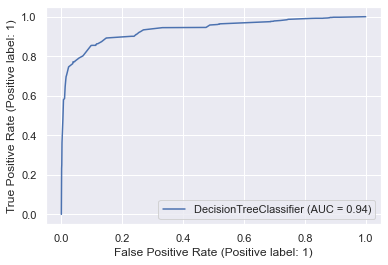

In [123]:
metrics.plot_roc_curve(dt_adasyn, X_test, y_test)
plt.show()

## Metrics for Decision Trees - ADASYN:

    -Recall on Train: 0.85
    -Recall on Test: 0.85
    -Area Under the Curve: 0.93

# 3.a Random Forest - Unsampled

In [124]:
rf_unsampled = RandomForestClassifier(random_state=42).fit(X_train, y_train)

### Using trial and error methods, fixing hyper-parameters to:

In [125]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the n_estimators:

params = {
    'max_depth': [7,10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [10,15,30]
}

grid_search_7 = GridSearchCV(estimator=rf_unsampled,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [126]:
%%time
grid_search_7.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Wall time: 6min 19s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [7, 10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [10, 15, 30]},
             scoring='recall', verbose=1)

In [127]:
rf_best = grid_search_7.best_estimator_
model_evaluate_unsampled(rf_best)

Train set performance:
0.2760703499733523
[[966413    464]
 [  4075   1554]]
-------------------------
Test set performance:

 0.23388385721896643

 [[322130    162]
 [  1438    439]]


In [128]:
grid_search_7.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 15}

### ROC Curve

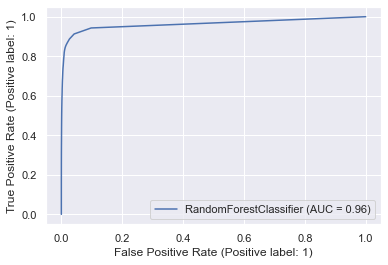

In [129]:
metrics.plot_roc_curve(rf_unsampled, X_test, y_test)
plt.show()

### Metrics for Random Forest - Unsampled:

    -Recall on Train: 0.27
    -Recall on Test: 0.23
    -Area Under the Curve: 0.96

# 3.b Random Forest - SMOTE

In [130]:
#Random forest fit 
rf_smote = RandomForestClassifier(random_state=42).fit(X_train_smote, y_train_smote)

In [131]:
#Defining parameters
params = {
    'max_depth': [7,10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [10,15,30]
}

grid_search_8 = GridSearchCV(estimator=rf_smote,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [132]:
%%time
grid_search_8.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Wall time: 11min 43s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [7, 10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [10, 15, 30]},
             scoring='recall', verbose=1)

In [133]:
rf_smote = grid_search_8.best_estimator_
model_evaluate_smote(rf_smote)

Train set performance:
0.828343212218307
[[923710  43167]
 [165971 800906]]
-------------------------
Test set performance:

 0.7906233351092168

 [[307923  14369]
 [   393   1484]]


In [134]:
grid_search_8.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 10}

### ROC Curve

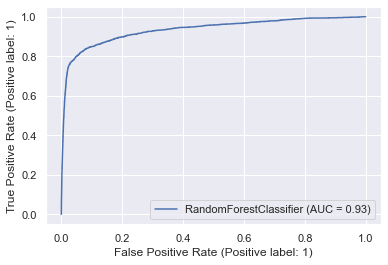

In [135]:
metrics.plot_roc_curve(rf_smote, X_test, y_test)
plt.show()

## Metrics for Random Forest - SMOTE:

    -Recall on Train: 0.82
    -Recall on Test: 0.78
    -Area Under the Curve: 0.93

# 3.c Random Forest - ADASYN

In [136]:
rf_adasyn = RandomForestClassifier(random_state=42).fit(X_train_adasyn, y_train_adasyn)

In [137]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the n_estimators:

params = {
    'max_depth': [7,10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [10,15,30]
}

grid_search_9 = GridSearchCV(estimator=rf_adasyn,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [138]:
%%time
grid_search_9.fit(X_train_adasyn, y_train_adasyn)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Wall time: 9min 44s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [7, 10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [10, 15, 30]},
             scoring='recall', verbose=1)

In [139]:
grid_search_9.best_score_

0.8126802436396785

In [140]:
rf_adasyn = grid_search_9.best_estimator_
model_evaluate_adasyn(rf_adasyn)

Train set performance:

 0.8084818098947543

 [[929214  37663]
 [184884 780476]]
-------------------------
Test set performance:

 0.783697389451252


In [141]:
grid_search_9.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 10}

### ROC Curve

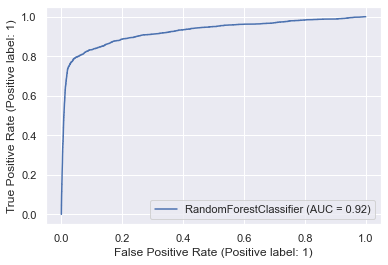

In [142]:
metrics.plot_roc_curve(rf_adasyn, X_test, y_test)
plt.show()

## Metrics for Random Forest - ADASYN:

    -Recall on Train: 0.82
    -Recall on Test: 0.79
    -Area Under the Curve: 0.93

# 4.a XGBoost - Unsampled

In [143]:
from xgboost import XGBClassifier

In [144]:
xgb_unsampled = XGBClassifier().fit(X_train, y_train)

In [145]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the learning_rate:

params = {
    'max_depth': [10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [15,30],
    'learning_rate': [0.1,0.3,0.5]
}

grid_search_10 = GridSearchCV(estimator=xgb_unsampled,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [146]:
%%time
grid_search_10.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[21:28:15] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "criterion", "min_samples_leaf" } are not used.

Wall time: 14min 40s


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'criterion': ['gini'],
                         'learning_rate': [0.1, 0.3, 0.5], 'max_depth': [10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [15, 30]},
             scoring='recall', verbose=1)

In [147]:
xgb_best_unsampled = grid_search_10.best_estimator_
model_evaluate_unsampled(xgb_best_unsampled)

Train set performance:
0.6544679339136614
[[966671    206]
 [  1945   3684]]
-------------------------
Test set performance:

 0.4613745338305807

 [[322057    235]
 [  1011    866]]


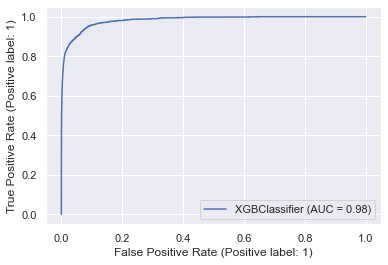

In [148]:
metrics.plot_roc_curve(xgb_unsampled, X_test, y_test)
plt.show()

### Metrics for XGBoost - Unsampled:

    -Recall on Train: 0.65
    -Recall on Test: 0.46
    -Area Under the Curve: 0.98

# 4.b XGBoost - SMOTE

In [149]:
xgb_smote = XGBClassifier().fit(X_train_smote, y_train_smote)

In [150]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the learning_rate:

params = {
    'max_depth': [10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [15,30],
    'learning_rate': [0.1]
}

grid_search_11 = GridSearchCV(estimator=xgb_smote,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [151]:
%%time
grid_search_11.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[21:41:02] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "criterion", "min_samples_leaf" } are not used.

Wall time: 11min 42s


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'criterion': ['gini'], 'learning_rate': [0.1],
                         'max_depth': [10], 'min_samples_leaf': [50, 80],
                         'n_estimators': [15, 30]},
             scoring='recall', verbose=1)

In [152]:
xgb_best_smote = grid_search_11.best_estimator_
model_evaluate_smote(xgb_best_smote)

Train set performance:
0.8699782909304906
[[912923  53954]
 [125715 841162]]
-------------------------
Test set performance:

 0.8172615876398508

 [[303933  18359]
 [   343   1534]]


In [153]:
grid_search_11.best_params_

{'criterion': 'gini',
 'learning_rate': 0.1,
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 30}

### ROC Curve

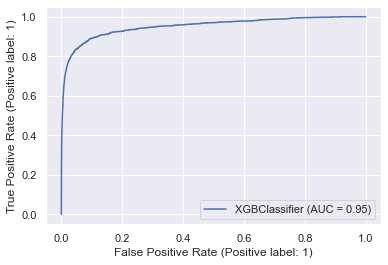

In [154]:
metrics.plot_roc_curve(xgb_smote, X_test, y_test)
plt.show()

### Metrics for XGBoost - SMOTE:

    -Recall on Train: 0.87
    -Recall on Test: 0.81
    -Area Under the Curve: 0.95

# 4.c XGBoost - ADASYN

In [155]:
xgb_adasyn = XGBClassifier().fit(X_train_adasyn, y_train_adasyn)

In [156]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the learning_rate:

params = {
    'max_depth': [10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [15,30],
    'learning_rate': [0.1]
}

grid_search_12 = GridSearchCV(estimator=xgb_adasyn,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [157]:
%%time
grid_search_12.fit(X_train_adasyn, y_train_adasyn)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[21:52:03] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "criterion", "min_samples_leaf" } are not used.

Wall time: 9min 32s


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'criterion': ['gini'], 'learning_rate': [0.1],
                         'max_depth': [10], 'min_samples_leaf': [50, 80],
                         'n_estimators': [15, 30]},
             scoring='recall', verbose=1)

In [158]:
xgb_best_adasyn = grid_search_12.best_estimator_
model_evaluate_adasyn(xgb_best_adasyn)

Train set performance:

 0.866838277948123

 [[910649  56228]
 [128549 836811]]
-------------------------
Test set performance:

 0.8231220031965903


In [159]:
grid_search_12.best_params_

{'criterion': 'gini',
 'learning_rate': 0.1,
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 30}

### ROC Curve

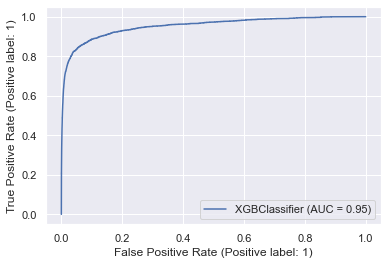

In [160]:
metrics.plot_roc_curve(xgb_adasyn, X_test, y_test)

### Metrics for Random Forest - SMOTE:

    -Recall on Train: 0.86
    -Recall on Test: 0.81
    -Area Under the Curve: 0.95

## Testing the results on the unseen Test Data: (Using feature "Split_labels"==test))

In [161]:
test_org=concat_df[concat_df["split_label"]=="test"]
test_org.head()

,cc_num,merchant,category,amt,gender,street,city,state,zip,city_pop,job,trans_num,unix_time,is_fraud,split_label,trans_date,trans_Time,age_at_trans,day_of_week,month,dist_in_km
0,2291163933867244,fraud_Kirlin and Sons,personal_care,1.050822,0,351 Darlene Green,Columbia,SC,29209,12.717389,Mechanical engineer,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,0,test,2020-06-21,12:14:25,52,7,6,24.561462
1,3573030041201292,fraud_Sporer-Keebler,personal_care,3.395850,1,3638 Marsh Union,Altonah,UT,84002,5.710427,"Sales professional, IT",324cc204407e99f51b0d6ca0055005e7,1371816873,0,test,2020-06-21,12:14:33,30,7,6,104.925092
2,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,3.720378,1,9333 Valentine Point,Bellmore,NY,11710,10.448599,"Librarian, public",c81755dbbbea9d5c77f094348a7579be,1371816893,0,test,2020-06-21,12:14:53,50,7,6,59.080078
3,3591919803438423,fraud_Haley Group,misc_pos,4.095178,0,32941 Krystal Mill Apt. 552,Titusville,FL,32780,10.910843,Set designer,2159175b9efe66dc301f149d3d5abf8c,1371816915,0,test,2020-06-21,12:15:15,33,7,6,27.698567
4,3526826139003047,fraud_Johnston-Casper,travel,1.160021,0,5783 Evan Roads Apt. 465,Falmouth,MI,49632,7.026427,Furniture designer,57ff021bd3f328f8738bb535c302a31b,1371816917,0,test,2020-06-21,12:15:17,65,7,6,104.335106


In [162]:
#Checking Shape to verify with original test data
test_org.shape

(555719, 21)

#### Note 

    - I have Already performed all transaformation by consolidated data
    - Now i have to directly choose relevant features which required to test Models
    - Already log transformation performed to remove skewness in data

In [163]:
# Selecting usefull features for model building['amt', 'gender', 'city_pop', 'age_at_trans', 'day_of_week', 'month', 'dist_in_km']

test_org=test_org[['amt', 'gender', 'city_pop', 'age_at_trans', 'day_of_week', 'month', 'dist_in_km',"is_fraud"]]
test_org.head()

,amt,gender,city_pop,age_at_trans,day_of_week,month,dist_in_km,is_fraud
0,1.050822,0,12.717389,52,7,6,24.561462,0
1,3.395850,1,5.710427,30,7,6,104.925092,0
2,3.720378,1,10.448599,50,7,6,59.080078,0
3,4.095178,0,10.910843,33,7,6,27.698567,0
4,1.160021,0,7.026427,65,7,6,104.335106,0


## Model Selection and Model Building

- Based on the Recall scores, AUC Scores, and Confusion Matrices collected from the 12 algorithms 
  (4 algorithms - unsampled and sampled), following is the summary of all values to help us pick the best model of all:

In [164]:
summary_dict = {
    'Model': ['Logistic Regression - Unsampled', 'Logistic Regression - SMOTE', 'Logistic Regression - ADASYN',
             'Decision Trees - Unsampled', 'Decision Trees - SMOTE', 'Decision Trees - ADASYN',
             'Random Forest - Unsampled', 'Random Forest - SMOTE', 'Random Forest - ADASYN',
             'XGBoost - Unsampled', 'XGBoost - SMOTE', 'XGBoost - ADASYN'],
    'Recall on Train' : [0.0,0.78,0.729,0.33,0.85,0.85,0.27,0.82,0.82,0.65,0.87,0.86],
    'Recall on Test' : [0.988,1,1,0.3,0.83,0.85,0.23,0.78,0.79,0.46,0.81,0.81],
    'AUC Score' : [0.52,0.56,0.63,0.73,0.93,0.93,0.96,0.93,0.93,0.98,0.95,0.95]
}

summary_df = pd.DataFrame(summary_dict)
summary_df

,Model,Recall on Train,Recall on Test,AUC Score
0,Logistic Regression - Unsampled,0.000,0.988,0.52
1,Logistic Regression - SMOTE,0.780,1.000,0.56
2,Logistic Regression - ADASYN,0.729,1.000,0.63
3,Decision Trees - Unsampled,0.330,0.300,0.73
4,Decision Trees - SMOTE,0.850,0.830,0.93
5,Decision Trees - ADASYN,0.850,0.850,0.93
6,Random Forest - Unsampled,0.270,0.230,0.96
7,Random Forest - SMOTE,0.820,0.780,0.93
8,Random Forest - ADASYN,0.820,0.790,0.93
9,XGBoost - Unsampled,0.650,0.460,0.98


In [165]:
#Sorting Values on basis of AUC
summary_df.sort_values(by=['AUC Score'], ascending = False)

,Model,Recall on Train,Recall on Test,AUC Score
9,XGBoost - Unsampled,0.650,0.460,0.98
6,Random Forest - Unsampled,0.270,0.230,0.96
10,XGBoost - SMOTE,0.870,0.810,0.95
11,XGBoost - ADASYN,0.860,0.810,0.95
4,Decision Trees - SMOTE,0.850,0.830,0.93
5,Decision Trees - ADASYN,0.850,0.850,0.93
7,Random Forest - SMOTE,0.820,0.780,0.93
8,Random Forest - ADASYN,0.820,0.790,0.93
3,Decision Trees - Unsampled,0.330,0.300,0.73
2,Logistic Regression - ADASYN,0.729,1.000,0.63


### Based on the AUC Scores & Recall on Train and Test, checking the final test dataset


In [166]:
# Splitting the test data into X and y:

y_final = test_org.pop('is_fraud')
X_final = test_org

In [167]:
X_final.shape

(555719, 7)

#### 1. Testing the unseen data by using XGBoost - ADASYN Modelled Predictors:

In [168]:
y_pred_xgb = xgb_best_adasyn.predict(X_final)
print("Recall score - ",recall_score(y_final, y_pred_xgb))
print("\nConfusion Matrix \n",confusion_matrix(y_final, y_pred_xgb))

Recall score -  0.7431235431235431

Confusion Matrix 
 [[531099  22475]
 [   551   1594]]


XGBoost - ADASYN has a 73.70% recall score

#### 2. Testing the unseen data by using XGBoost - SMOTE Modelled Predictors:

In [169]:
y_pred_xgb_ = xgb_best_smote.predict(X_final)
print("Recall score - ",recall_score(y_final, y_pred_xgb_))
print("\nConfusion Matrix \n",confusion_matrix(y_final, y_pred_xgb_))

Recall score -  0.7491841491841492

Confusion Matrix 
 [[531523  22051]
 [   538   1607]]


XGBoost - SMOTE has a 74.82% recall score

#### 3. Testing the unseen data by using Decision Tree - SMOTE Modelled Predictors:

In [170]:
y_pred_final_dt = dt_smote.predict(X_final)
print("Recall score - ",recall_score(y_final, y_pred_final_dt))
print("\nConfusion Matrix \n",confusion_matrix(y_final, y_pred_final_dt))

Recall score -  0.772027972027972

Confusion Matrix 
 [[522819  30755]
 [   489   1656]]


Decision Tree - SMOTE has a 77.1% recall score

#### 4. Testing the unseen data by using Decision Tree - ADASYN Modelled Predictors:

In [171]:
y_pred_final_dt_ = dt_adasyn.predict(X_final)
print("Recall score - ",recall_score(y_final, y_pred_final_dt_))
print("\nConfusion Matrix \n",confusion_matrix(y_final, y_pred_final_dt_))

Recall score -  0.779020979020979

Confusion Matrix 
 [[519406  34168]
 [   474   1671]]


Decision Tree - ADASYN has a 78.6% recall score

#### 5. Testing the unseen data by using Random Forest - SMOTE Modelled Predictors:

In [172]:
y_pred_final_rf = rf_smote.predict(X_final)
print("Recall score - ",recall_score(y_final, y_pred_final_rf))
print("\nConfusion Matrix \n",confusion_matrix(y_final, y_pred_final_rf))

Recall score -  0.7431235431235431

Confusion Matrix 
 [[537517  16057]
 [   551   1594]]


Random Forest - SMOTE has a 75.43% recall score

#### 6. Testing the unseen data by using Random Forest - ADASYN Modelled Predictors:

In [173]:
y_pred_final_rf_ = rf_adasyn.predict(X_final)
print("Recall score - ",recall_score(y_final, y_pred_final_rf_))
print("\nConfusion Matrix \n",confusion_matrix(y_final, y_pred_final_rf_))

Recall score -  0.744988344988345

Confusion Matrix 
 [[537298  16276]
 [   547   1598]]


Random Forest - ADASYN has a 75.4% recall score

### Decision Trees - ADASYN model is the best as it has 78.6% Sensitivity towards predicting Fraudulent Transactions

In [174]:
# Let us check the confusion matrix for this test data:

cnf = confusion_matrix(y_final, y_pred_final_dt_)
cnf

array([[519406,  34168],
       [   474,   1671]], dtype=int64)

In [175]:
#Creating a dataframe to compare the actual v/s predicted values of y:

y_pred_final_dt_ = pd.Series(y_pred_final_dt_)
df_pred = pd.concat([X_final, y_final,y_pred_final_dt_], axis = 1)
df_pred.rename(columns = {0:'y_pred'}, inplace = True)
df_pred.head()

,amt,gender,city_pop,age_at_trans,day_of_week,month,dist_in_km,is_fraud,y_pred
0,1.050822,0,12.717389,52,7,6,24.561462,0,0
1,3.395850,1,5.710427,30,7,6,104.925092,0,0
2,3.720378,1,10.448599,50,7,6,59.080078,0,0
3,4.095178,0,10.910843,33,7,6,27.698567,0,0
4,1.160021,0,7.026427,65,7,6,104.335106,0,0


In [176]:
# Extracting only the fraudulent transactions from this test dataset:

fraud_df = df_pred[df_pred["is_fraud"]==1]
fraud_df.head()

,amt,gender,city_pop,age_at_trans,day_of_week,month,dist_in_km,is_fraud,y_pred
1685,3.212455,1,3.135494,51,7,6,80.649140,1,0
1767,6.659960,0,7.174724,62,7,6,66.097917,1,1
1781,6.430252,0,7.174724,62,7,6,28.837509,1,1
1784,6.982575,0,11.175142,26,7,6,103.089027,1,1
1857,6.736552,1,3.135494,51,7,6,60.504949,1,1


### Let's check the AUC on the final test data

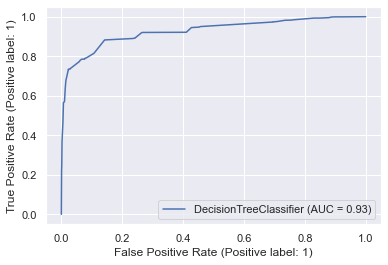

In [177]:
metrics.plot_roc_curve(dt_adasyn, X_final, y_final)
plt.show()

##### Area Under the Curve is 0.92

# Cost Benefit Analysis

    -The Cost Benefit Analysis is to be done on the original data
    -Using Orignal dataframe created  by merging both (Train & Test)

In [178]:
# Let us merge the dataset to form the original

orig_cons = pd.concat([train_orignal, test_orignal], axis=0)
orig_cons.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,NC,28654,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,WA,99160,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,ID,83252,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,MT,59632,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,VA,24433,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [179]:
orig_cons.shape

(1852394, 22)

In [180]:
orig_cons.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1852394 entries, 0 to 555718
Data columns (total 22 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   trans_date_trans_time  object 
 1   cc_num                 int64  
 2   merchant               object 
 3   category               object 
 4   amt                    float64
 5   first                  object 
 6   last                   object 
 7   gender                 object 
 8   street                 object 
 9   city                   object 
 10  state                  object 
 11  zip                    int64  
 12  lat                    float64
 13  long                   float64
 14  city_pop               int64  
 15  job                    object 
 16  dob                    object 
 17  trans_num              object 
 18  unix_time              int64  
 19  merch_lat              float64
 20  merch_long             float64
 21  is_fraud               int64  
dtypes: float64(5), int6

#### Let us take a look at what we need to do in order to perform the cost-benefit analysis step by step:

##### Part I: Analyse the dataset and find the following figures:

    1.Average number of transactions per month
    2.Average number of fraudulent transactions per month
    3.Average amount per fraudulent transaction

In [181]:
#Extracting year as new column from date

orig_cons['trans_date_trans_time'] = pd.to_datetime(orig_cons['trans_date_trans_time'])

orig_cons['trans_date']=orig_cons['trans_date_trans_time'].dt.strftime('%Y-%m-%d') #to seperate transaction date for future analysis

orig_cons['dob']=pd.to_datetime(orig_cons['dob']) #Converting Date of birth in datetime

orig_cons['trans_date'] = pd.to_datetime(orig_cons['trans_date'])

orig_cons['year']=orig_cons['trans_date'].dt.year

In [182]:
orig_cons['month']=orig_cons['trans_date'].dt.month

In [183]:
orig_cons.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,trans_date,year,month
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,NC,28654,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,2019-01-01,2019,1
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,WA,99160,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,2019-01-01,2019,1
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,ID,83252,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,2019-01-01,2019,1
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,MT,59632,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,2019-01-01,2019,1
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,VA,24433,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,2019-01-01,2019,1


In [184]:
# Group by variable creation

year_month_grp = orig_cons.groupby(["year","month"])["trans_num"].count()
year_month_grp

year  month
2019  1         52525
      2         49866
      3         70939
      4         68078
      5         72532
      6         86064
      7         86596
      8         87359
      9         70652
      10        68758
      11        70421
      12       141060
2020  1         52202
      2         47791
      3         72850
      4         66892
      5         74343
      6         87805
      7         85848
      8         88759
      9         69533
      10        69348
      11        72635
      12       139538
Name: trans_num, dtype: int64

In [185]:
# Since the given (original) dataset is from Jan 1 2019 to Dec 31 2020, the data is of 24 months
# Total transactions can be found by checking the shape of the original dataframe
# Avg transactions per month would be to divide that shape/total by 24 (months)

avg_transactions_pm = orig_cons.shape[0]//24
print("1. Avg transactions per month:- ",avg_transactions_pm)

1. Avg transactions per month:-  77183


In [186]:
# Checking only for fraudulent transactions:

fraud_data_1=orig_cons[orig_cons["is_fraud"] == 1]
fraud_data_1

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,trans_date,year,month
2449,2019-01-02 01:06:37,4613314721966,fraud_Rutherford-Mertz,grocery_pos,281.06,Jason,Murphy,M,542 Steve Curve Suite 011,Collettsville,NC,28611,35.9946,-81.7266,885,Soil scientist,1988-09-15,e8a81877ae9a0a7f883e15cb39dc4022,1325466397,36.430124,-81.179483,1,2019-01-02,2019,1
2472,2019-01-02 01:47:29,340187018810220,"fraud_Jenkins, Hauck and Friesen",gas_transport,11.52,Misty,Hart,F,27954 Hall Mill Suite 575,San Antonio,TX,78208,29.4400,-98.4590,1595797,Horticultural consultant,1960-10-28,bc7d41c41103877b03232f03f1f8d3f5,1325468849,29.819364,-99.142791,1,2019-01-02,2019,1
2523,2019-01-02 03:05:23,340187018810220,fraud_Goodwin-Nitzsche,grocery_pos,276.31,Misty,Hart,F,27954 Hall Mill Suite 575,San Antonio,TX,78208,29.4400,-98.4590,1595797,Horticultural consultant,1960-10-28,b98f12f4168391b2203238813df5aa8c,1325473523,29.273085,-98.836360,1,2019-01-02,2019,1
2546,2019-01-02 03:38:03,4613314721966,fraud_Erdman-Kertzmann,gas_transport,7.03,Jason,Murphy,M,542 Steve Curve Suite 011,Collettsville,NC,28611,35.9946,-81.7266,885,Soil scientist,1988-09-15,397894a5c4c02e3c61c784001f0f14e4,1325475483,35.909292,-82.091010,1,2019-01-02,2019,1
2553,2019-01-02 03:55:47,340187018810220,fraud_Koepp-Parker,grocery_pos,275.73,Misty,Hart,F,27954 Hall Mill Suite 575,San Antonio,TX,78208,29.4400,-98.4590,1595797,Horticultural consultant,1960-10-28,7863235a750d73a244c07f1fb7f0185a,1325476547,29.786426,-98.683410,1,2019-01-02,2019,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517197,2020-12-22 22:05:48,2242176657877538,"fraud_Willms, Kris and Bergnaum",shopping_pos,1041.51,Travis,Daniel,M,1327 Rose Causeway Apt. 610,Senatobia,MS,38668,34.6323,-89.8855,14462,Database administrator,1959-03-03,35b0297dd026d2e9a75d024a5dec7955,1387749948,34.573471,-89.911011,1,2020-12-22,2020,12
517274,2020-12-22 22:18:07,2242176657877538,fraud_Kuhn LLC,shopping_pos,868.09,Travis,Daniel,M,1327 Rose Causeway Apt. 610,Senatobia,MS,38668,34.6323,-89.8855,14462,Database administrator,1959-03-03,da7f67d7375f10a054a3d919448c45dd,1387750687,34.091227,-90.390612,1,2020-12-22,2020,12
517341,2020-12-22 22:31:48,2242176657877538,"fraud_Mosciski, Ziemann and Farrell",shopping_net,1039.42,Travis,Daniel,M,1327 Rose Causeway Apt. 610,Senatobia,MS,38668,34.6323,-89.8855,14462,Database administrator,1959-03-03,25b076c7bcd70f272c1c5326bb234f4b,1387751508,34.628434,-90.284780,1,2020-12-22,2020,12
517529,2020-12-22 23:06:03,2242176657877538,fraud_Bauch-Raynor,grocery_pos,289.27,Travis,Daniel,M,1327 Rose Causeway Apt. 610,Senatobia,MS,38668,34.6323,-89.8855,14462,Database administrator,1959-03-03,2df7d894868fbc99ec1d8b055585fc9d,1387753563,34.746063,-90.401093,1,2020-12-22,2020,12


In [187]:
fraud_data_1.shape

(9651, 25)

In [188]:
# Fraudulent transactions are 9651 (number of rows) that are spread across 24 months
# Avg fraudulent transactions per month would be to divide the shape/total fraudulent rows by 24 (months)

avg_fraudtrans_pm = fraud_data_1.shape[0]/24
print("2. Average number of fraudulent transactions per month are:", round(avg_fraudtrans_pm,5))

2. Average number of fraudulent transactions per month are: 402.125


In [189]:
# Average amount per fraudulent transaction is the total fraudulent amount divided by the total number of fraudulent transactions

avg_fraud_amt = (fraud_data_1["amt"].sum())/fraud_data_1.shape[0]
print("3. Average amount per fraudulent transactions is:", round(avg_fraud_amt,5))

3. Average amount per fraudulent transactions is: 530.66141


### Part II: Compare the cost incurred per month by the bank before and after the model deployment:

    1.Cost incurred per month before the model was deployed = Average amount per fraudulent transaction * Average number of           fraudulent transactions per month
    
    2.Cost incurred per month after the model is built and deployed: (Use the test metric from the model evaluation part 
    and the calculations performed in Part I to compute the values given below)
    
    
    -Let TF be the average number of transactions per month detected as fraudulent by the model and let the cost of 
    providing customer executive support per fraudulent transaction detected by the model = USD 1.5

    -Total cost of providing customer support per month for fraudulent transactions detected by the model = 1.5 * TF.

    -Let FN be the average number of transactions per month that are fraudulent but not detected by the model

    -Cost incurred due to these fraudulent transactions left undetected by the model = Average amount per 
    fraudulent transaction * FN
    
    -Therefore, the cost incurred per month after the model is built and deployed = 1.5 * TF + Average amount per 
    fraudulent transaction * FN
    
    -Final savings = Cost incurred before - Cost incurred after

In [190]:
# Calculating the cost incurred before deploying the model based on the first point descibed above:

cost_before_model = avg_fraud_amt*avg_fraudtrans_pm
print("cost incurred before deploying the model:- ",round(cost_before_model,2))

cost incurred before deploying the model:-  213392.22


In [191]:
fraud_df.head()

,amt,gender,city_pop,age_at_trans,day_of_week,month,dist_in_km,is_fraud,y_pred
1685,3.212455,1,3.135494,51,7,6,80.649140,1,0
1767,6.659960,0,7.174724,62,7,6,66.097917,1,1
1781,6.430252,0,7.174724,62,7,6,28.837509,1,1
1784,6.982575,0,11.175142,26,7,6,103.089027,1,1
1857,6.736552,1,3.135494,51,7,6,60.504949,1,1


In [192]:
fraud_df["month"].value_counts()

8     415
10    384
9     340
7     321
11    294
12    258
6     133
Name: month, dtype: int64

In [193]:
# Let TF be the average number of transactions per month detected as fraudulent by the model 
# Since the test dataframe has 7 months data, dividing by 7

TF = fraud_df["y_pred"].sum()//7
print("Total cost of providing customer support per month for fraudulent transactions detected by the model =", TF*1.5)

Total cost of providing customer support per month for fraudulent transactions detected by the model = 357.0


In [194]:
# Let FN be the average number of transactions per month that are fraudulent but not detected by the model
# Since the test dataframe has 7 months data, dividing by 7

FN = fraud_df[fraud_df["y_pred"]==0]["is_fraud"].sum()//7
print("Cost incurred due to these fraudulent transactions left undetected by the model =", round(FN*avg_fraud_amt,5))

Cost incurred due to these fraudulent transactions left undetected by the model = 35554.31462


In [195]:
# Cost incurred after the model is deployed:

cost_after_model = (TF*1.5) + (FN*avg_fraud_amt)
print("Cost incurred after the model:- ",round(cost_after_model,5))

Cost incurred after the model:-  35911.31462


In [196]:
# Final savings = Cost incurred before - Cost incurred after

Final_Savings = int(cost_before_model - cost_after_model)
print("Final Savings after deploying the model are: $",Final_Savings)

Final Savings after deploying the model are: $ 177480


# Submitted By -

    - Prashant Singh
    - Vaibhav Singh
    - Shreya Mandlesha

